# Advanced Filtering & Blurring Techniques

In our third blog covering manipulation techniques in OpenCV we will be covering a few more advanced techniques, this time mainly relating to different types of blurring and filtering. All of these will prove to be exceptionally useful when it comes to machine learning training on their own merits, but like the last blog, they will also be pre-processing steps for other techniques down the line.

In [1]:
# @title Contact Software Sushi {"display-mode":"form"}
import base64
import requests
import urllib.request
from IPython.display import display, HTML

image_url = "https://raw.githubusercontent.com/SoftwareSushi/marketing-resources/main/images/company/logo.png"
with urllib.request.urlopen(image_url) as response:
    image_data = response.read()
    encoded_image = base64.b64encode(image_data).decode()

def load_html_from_github(raw_url):
    response = requests.get(raw_url)
    html_content = response.text
    updated_html = html_content.replace('../images/logo.png', f"data:image/png;base64, {encoded_image}")
    display(HTML(updated_html))

load_html_from_github('https://raw.githubusercontent.com/SoftwareSushi/marketing-resources/refs/heads/main/html/cta-banner-with-logo.html')

###Imports & Sample Images###

In [2]:
import cv2
import numpy as np
import urllib.request
import matplotlib.pyplot as plt

In [4]:
# Collecting the sample image
image_url = "https://raw.githubusercontent.com/SoftwareSushi/marketing-resources/main/images/opencv_blog/part_3/Parrot_in_space.png"
resp = urllib.request.urlopen(image_url)
image_bytes = np.asarray(bytearray(resp.read()), dtype=np.uint8)

###Utils###

In [5]:
# Function for the creation of flexible MatPlotLib figures
def create_mpl_figure(w,h,images,titles="Image",axis="off"):
    plt.figure(figsize=[w,h])
    for i, image in enumerate(images):
        plt.subplot(1,len(images),i+1); plt.imshow(image); plt.title(titles[i]); plt.axis(axis);

# Function for the addition of Gaussian Noise to an Image
def add_gaussian_noise(image, mean=0, std=25):
    noise = np.random.normal(mean, std, image.shape).astype(np.uint8)
    noisy_image = cv2.add(image, noise)
    return noisy_image

# Function for the addition of Salt and Pepper noise to an Image
def add_salt_and_pepper_noise(image, noise_ratio=0.02):
    noisy_image = image.copy()
    h,w,c = image.shape
    noisy_pixels = int(h*w*noise_ratio)

    for _ in range(noisy_pixels):
        row, col = np.random.randint(0,h), np.random.randint(0,w)
        if np.random.rand() < 0.5:
            noisy_image[row, col] = [0, 0, 0]
        else:
            noisy_image[row, col] = [255, 255, 255]

    return noisy_image

## List of Techniques

* Color Space Conversions
* Mean Filtering
* Gaussian Filtering
* Median Blurring
* Bilateral Filtering

## Use Cases

Of the various techniques we will be covering in this blog, things like color space conversions and how they allow for swifter image processing and  image thresholding (which we have already demonstrated during the creation of masks in the last blog) or various different types of filtering to allow for removal of noise from images or edge detection, the techniques covered in this blog will include a number of common pre-processing steps for other techniques.

## Techniques

### Color Space Conversions

**What it does:** As the name suggests, color space conversions convert an image of one color space (Grayscale, BGR, RGB, HSLuv, YCrCb) and converts it to another color space.

**Why it matters:** Color space conversions can be exceedingly useful. If you want to increase processing speed, you can change images to the grayscale color space, and cut down on image processing times up to ~66%. If you want to work on color based image masking, changing to another color space can assist considerably in the task.

**The Code & Output**

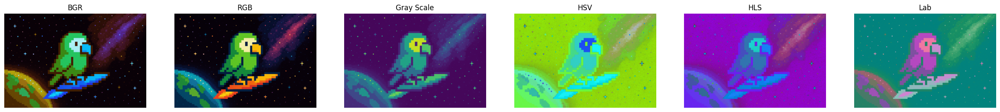

In [6]:
# Reading the sample image
bgr_image = cv2.imdecode(image_bytes, cv2.IMREAD_COLOR)

# Color space conversions
rgb_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2RGB)
gray_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2GRAY)
hsv_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2HSV)
hls_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2HLS)
lab_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2LAB)

# Creation of the MatPlotLib figure for comparison of images
create_mpl_figure(30, 10, [bgr_image, rgb_image, gray_image, hsv_image, hls_image, lab_image], ["BGR", "RGB", "Gray Scale", "HSV", "HLS", "Lab"])

### Mean Filtering:

**What it does:** Mean filtering evaluates every pixel, and according to a box filter around the given pixel of *n* x *n* pixels, the pixel weight is averaged by taking all pixel values, adding them together, and then dividing by the number of pixels evaluated.

**Why it matters:** Mean filtering can be used to assist in the reduction of noise within images, as well as smoothing images. It is a common pre-processing step for many different image manipulation techniques.

**The Code & Output**

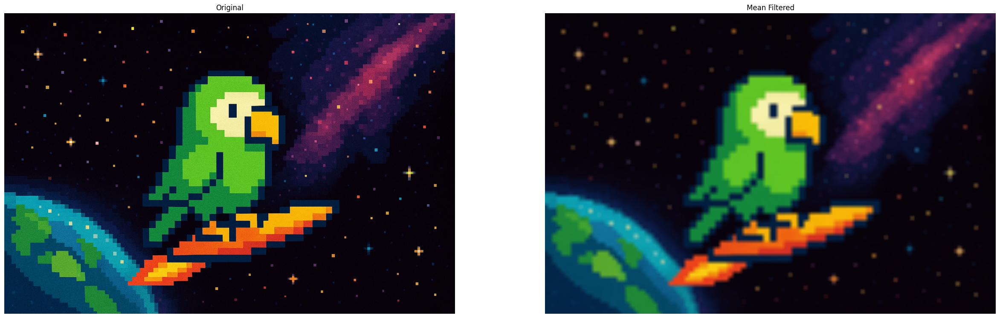

In [7]:
# Reading the sample image
bgr_image = cv2.imdecode(image_bytes, cv2.IMREAD_COLOR)

# Color conversion to ensure proper display of images
image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2RGB)

# Mean Filtering
box_filter = (15,15)

mean_image = cv2.blur(image, box_filter)

# Creation of the MatPlotLib figure for comparison of images
create_mpl_figure(30, 10, [image, mean_image], ["Original", "Mean Filtered"])

### Gaussian Filtering:

**What it does:** Gaussian filtering filters images by taking a kernel of *n* x *n* pixels from around the targeted pixel. According to the Gaussian curve, a bell-shaped curve that weighs those values towards the center highly and those further from the center lower, each pixel is once again filtered according to the values of the surrounding pixels, weighing more highly those closer to it. This is different than mean filtering, where each pixel within the box filter is weighed identically.

**Why it matters:** Gaussian filtering is extremely effective at handling gaussian noise, pre-processing images for edge detectors so that signal noise is not mis-interpreted as edges, or in real-time graphics creating depth of field or heat blur.

**The Code & Output**

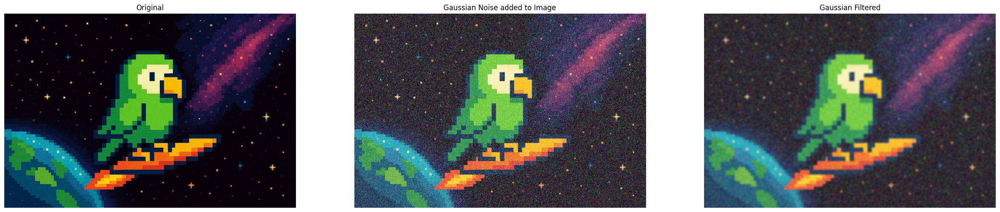

In [8]:
# Reading the sample image
bgr_image = cv2.imdecode(image_bytes, cv2.IMREAD_COLOR)

# Color conversion to ensure proper display of images
image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2RGB)

# Adding Gaussian Noise to the Image
noisy_image = add_gaussian_noise(image, mean=0, std=1)

# Gaussian Filtering
gaussian_kernel = (25,25)

gaussian_image = cv2.GaussianBlur(noisy_image, gaussian_kernel, 0)

# Creation of the MatPlotLib figure for comparison of images
create_mpl_figure(30, 10, [image, noisy_image, gaussian_image], ["Original", "Gaussian Noise added to Image", "Gaussian Filtered"])

### Median Blurring:

**What it does:** Median filtering, like the gaussian filtering before it takes a kernel that evaluates a given pixel and the pixels surrounding it according to the kernel *n* x *n* pixels. This kernel is a square denoted by a single positive, odd integer. From these values, median blurring will take the middle value, and apply it to the targeted pixel.

**Why it matters:** Median filtering is very effective for handling salt and pepper noise. Whether it be handling visual anomalies in CCTV or dashcam footage, median filtering is able to remove the salt and pepper noise without damaging detail to a very noticeable degree.

**The Code & Output**

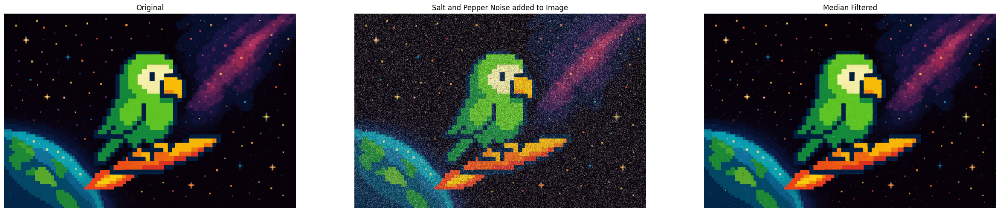

In [9]:
# Reading the sample image
bgr_image = cv2.imdecode(image_bytes, cv2.IMREAD_COLOR)

# Color conversion to ensure proper display of images
image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2RGB)

# Adding Salt and Pepper Noise to the Image
noisy_image = add_salt_and_pepper_noise(image, noise_ratio=0.20)

# Median Filtering
median_kernel = 3

median_image = cv2.medianBlur(noisy_image, median_kernel)

# Creation of the MatPlotLib figure for comparison of images
create_mpl_figure(30, 10, [image, noisy_image, median_image], ["Original", "Salt and Pepper Noise added to Image", "Median Filtered"])

### Bilateral Filtering:

**What it does:** Bilateral filtering smooths images while retaining sharp edges. It does this by averaging each pixel according to its surroundings if neighboring pixels are nearby to the evaluated pixel, and similar in intensity (or color dependent). It is similar in result to Gaussian filtering, but in this case, this technique is far more effective at retaining edges, though it less performance friendly.

**Why it matters:** Bilateral filtering is the most advanced filtering technique covered thus far and is exceptionally useful because of its ability to retain sharp details in images while blurring less important ones.

**The Code & Output**

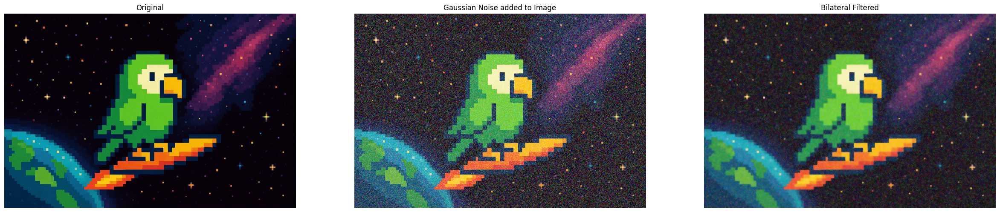

In [10]:
# Reading the sample image
bgr_image = cv2.imdecode(image_bytes, cv2.IMREAD_COLOR)

# Color conversion to ensure proper display of images
image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2RGB)

# Add Gaussian noise to the Image
noisy_image = add_gaussian_noise(image, mean=0, std=1)

# Bilateral Filtering
bilateral_image = cv2.bilateralFilter(noisy_image, 15, 200, 200)

# Creation of the MatPlotLib figure for comparison of images
create_mpl_figure(30, 10, [image, noisy_image, bilateral_image], ["Original", "Gaussian Noise added to Image", "Bilateral Filtered"])

## Conclusion

In the next blog we will be covering techniques such as image thresholding, binarization, and the watershed algorithm.

In [11]:
# @title Contact Software Sushi
load_html_from_github('https://raw.githubusercontent.com/SoftwareSushi/marketing-resources/refs/heads/main/html/cta-banner.html')